<a href="https://colab.research.google.com/github/robotonio/levelup_sml/blob/main/level_up.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Connect and authentcate with Google Earth Engine account (do it just the first time)

In [ ]:
#Import earth engine
import ee

# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize()

Upload files:


1.   image files you need to process
2.   csv files with the images data (lon/lat etc)*italicized text*



In [16]:
from google.colab import files

# upload GREENEYE photos 017, 217, 222, 236
# upload LEVELUP photos 016, 023, 083, 088, 337
uploaded = files.upload()

Saving data.csv to data (1).csv
Saving photo_083.jpg to photo_083.jpg


Display the original image you want to process

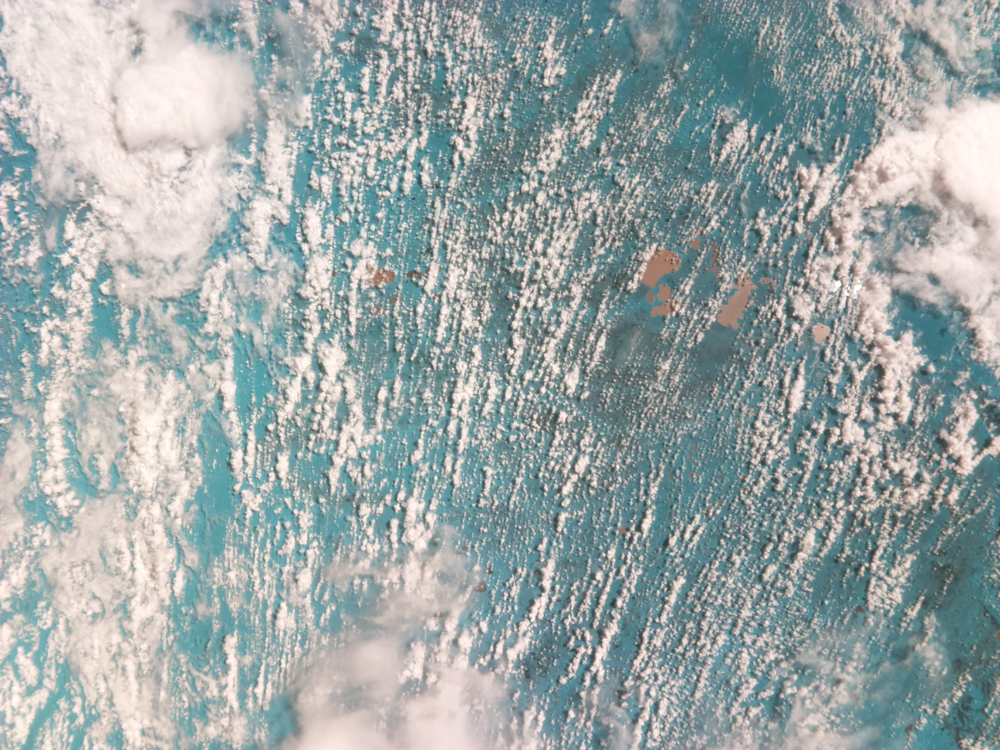

-1

In [17]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

image_num = 254
image = cv2.imread(f"photo_{image_num:03d}.jpg")
# resize image
image = cv2.resize(image, (1296, 972), interpolation = cv2.INTER_AREA)
cv2_imshow(image)
cv2.waitKey(0)



Create NDVI colour image

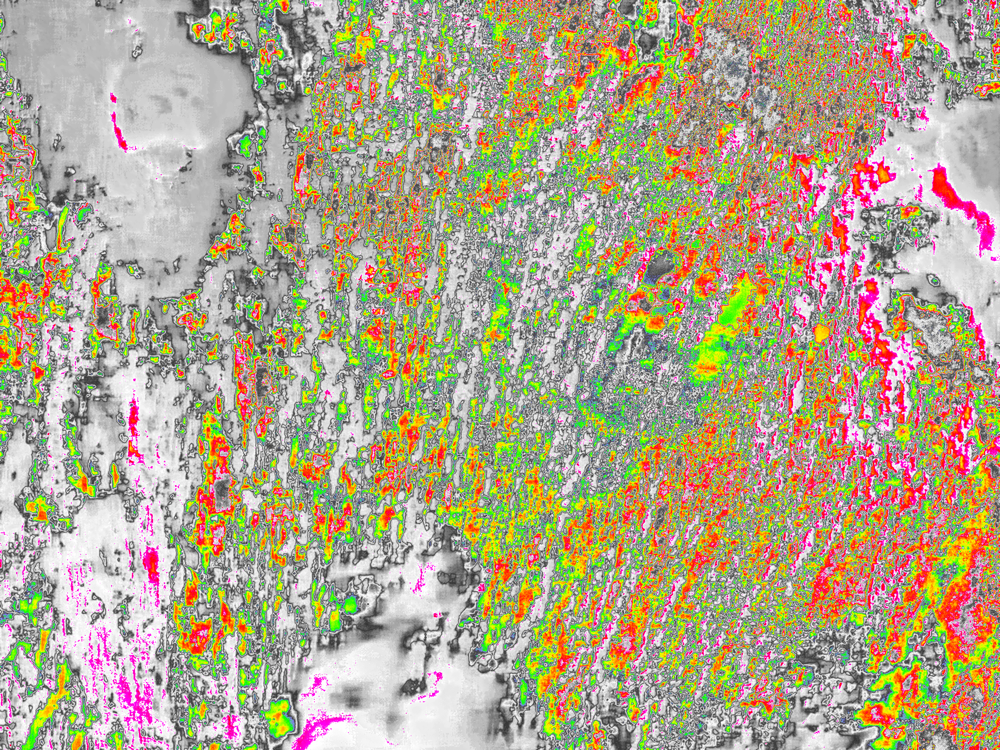

In [18]:
import cv2
import numpy as np
from numpy import uint8
from google.colab.patches import cv2_imshow

image = cv2.imread(f"photo_{image_num:03d}.jpg")

fastiecm = np.array([[[255, 255, 255]], [[250, 250, 250]], [[245, 245, 245]], [[241, 241, 241]], [[237, 237, 237]], [[232, 232, 232]], [[228, 228, 228]], [[225, 225, 225]], [[221, 221, 221]], [[216, 216, 216]], [[212, 212, 212]], [[208, 208, 208]], [[204, 204, 204]], [[199, 199, 199]], [[194, 194, 194]], [[190, 190, 190]], [[186, 186, 186]], [[182, 182, 182]], [[177, 177, 177]], [[174, 174, 174]], [[170,
170, 170]], [[166, 166, 166]], [[161, 161, 161]], [[157, 157, 157]], [[153, 153, 153]], [[148, 148, 148]], [[144, 144, 144]], [[139, 139, 139]], [[135, 135, 135]], [[131, 131, 131]], [[128, 128, 128]], [[123, 123, 123]], [[119, 119, 119]], [[115, 115, 115]], [[111, 111, 111]], [[106, 106, 106]], [[102, 102, 102]], [[97, 97, 97]], [[93, 93, 93]], [[89, 89, 89]], [[84, 84, 84]], [[80, 80, 80]], [[77, 77, 77]], [[73, 73, 73]], [[68, 68, 68]], [[64, 64, 64]], [[60, 60, 60]], [[55, 55, 55]], [[51, 51, 51]], [[55, 55, 55]], [[60, 60, 60]], [[64, 64, 64]], [[68, 68, 68]], [[73, 73, 73]], [[77, 77, 77]], [[80, 80, 80]], [[84, 84, 84]], [[89, 89, 89]], [[93, 93, 93]], [[97, 97, 97]], [[102, 102, 102]], [[106, 106, 106]], [[111, 111, 111]], [[115, 115, 115]], [[119, 119, 119]], [[123, 123, 123]], [[128, 128, 128]], [[131, 131, 131]], [[135, 135, 135]], [[139, 139, 139]], [[144, 144, 144]], [[148, 148, 148]], [[153, 153, 153]], [[157, 157, 157]], [[161, 161, 161]], [[166, 166, 166]], [[170, 170, 170]], [[174, 174, 174]], [[177, 177, 177]], [[182, 182, 182]], [[186, 186, 186]], [[190, 190, 190]], [[194, 194, 194]], [[199, 199, 199]], [[204, 204, 204]], [[208, 208, 208]], [[212, 212, 212]], [[216, 216, 216]], [[221, 221, 221]], [[225, 225, 225]], [[228, 228, 228]], [[232, 232, 232]], [[237, 237, 237]], [[241, 241, 241]], [[245, 245, 245]], [[250, 250, 250]], [[255, 255, 255]], [[250, 250, 250]], [[245, 245, 245]], [[240, 240, 240]], [[235, 235, 235]], [[230, 230, 230]], [[225, 225, 225]], [[219, 219, 219]], [[214, 214, 214]], [[209, 209, 209]], [[204, 204, 204]], [[199, 199, 199]], [[194, 194, 194]], [[190, 190, 190]], [[185, 185, 185]], [[180, 180, 180]], [[175, 175, 175]], [[170, 170, 170]], [[165, 165, 165]], [[160, 160, 160]], [[154, 154, 154]], [[151, 151, 151]], [[145, 145, 145]], [[140, 140, 140]], [[135, 135, 135]], [[130, 130, 130]], [[125, 125, 125]], [[120, 120, 120]], [[115, 115, 115]], [[111, 111, 111]], [[106, 106, 106]], [[101, 101, 101]], [[96, 96, 96]], [[91, 91, 91]], [[86, 86, 86]], [[80, 80, 80]], [[75, 75, 75]], [[70, 70, 70]], [[65, 65, 65]], [[60, 60, 60]], [[55, 55, 55]], [[79, 65, 65]], [[105, 77, 77]], [[129, 87, 87]], [[154, 97, 97]], [[180, 107, 107]], [[204, 119, 119]], [[230, 129, 129]], [[255, 139, 139]], [[239, 147, 130]], [[222, 153, 121]], [[207, 161, 112]], [[190, 167, 105]], [[175, 175, 96]], [[158, 182, 87]], [[143, 190, 78]], [[126, 196, 69]], [[111, 204, 60]], [[94, 211, 51]], [[78, 218, 42]], [[63, 226, 35]], [[46, 232, 26]], [[31, 240, 17]], [[14, 246, 8]], [[0, 255, 0]], [[0, 255, 7]], [[0, 255, 14]], [[0, 255, 23]], [[0, 255, 31]], [[0, 255, 38]], [[0, 255, 46]], [[0, 255, 55]], [[0, 255, 63]], [[0, 255, 70]], [[0, 255, 78]], [[0,
255, 87]], [[0, 255, 94]], [[0, 255, 102]], [[0, 255, 111]], [[0, 255, 119]], [[0, 255, 126]], [[0, 255, 134]], [[0, 255, 143]],
[[0, 255, 151]], [[0, 255, 158]], [[0, 255, 166]], [[0, 255, 175]], [[0, 255, 182]], [[0, 255, 190]], [[0, 255, 199]], [[0, 255,
207]], [[0, 255, 214]], [[0, 255, 222]], [[0, 255, 231]], [[0, 255, 239]], [[0, 255, 246]], [[0, 255, 255]], [[0, 249, 255]], [[0, 244, 255]], [[0, 239, 255]], [[0, 232, 255]], [[0, 227, 255]], [[0, 222, 255]], [[0, 217, 255]], [[0, 212, 255]], [[0, 207, 255]], [[0, 200, 255]], [[0, 195, 255]], [[0, 190, 255]], [[0, 185, 255]], [[0, 180, 255]], [[0, 175, 255]], [[0, 170, 255]], [[0, 163, 255]], [[0, 158, 255]], [[0, 153, 255]], [[0, 148, 255]], [[0, 143, 255]], [[0, 138, 255]], [[0, 131, 255]], [[0, 126, 255]], [[0, 121, 255]], [[0, 115, 255]], [[0, 111, 255]], [[0, 106, 255]], [[0, 100, 255]], [[0, 94, 255]], [[0, 89, 255]], [[0, 84, 255]], [[0, 78, 255]], [[0, 74, 255]], [[0, 69, 255]], [[0, 63, 255]], [[0, 58, 255]], [[0, 52, 255]], [[0, 46, 255]], [[0, 41, 255]], [[0, 37, 255]], [[0, 31, 255]], [[0, 26, 255]], [[0, 21, 255]], [[0, 14, 255]], [[0, 9, 255]], [[0, 4, 255]], [[0, 0, 255]],
[[14, 0, 255]], [[31, 0, 255]], [[46, 0, 255]], [[63, 0, 255]], [[78, 0, 255]], [[94, 0, 255]], [[111, 0, 255]], [[126, 0, 255]], [[143, 0, 255]], [[158, 0, 255]], [[175, 0, 255]], [[190, 0, 255]], [[207, 0, 255]], [[222, 0, 255]], [[239, 0, 255]]], dtype=uint8)

def display(win_name, image, scale=0.2, wait=True):
    image = np.array(image, dtype=float)/float(255)
    shape = image.shape
    height = int(shape[0] * scale)
    width = int(shape[1] * scale)
    image = cv2.resize(image, (width, height))
    # cv2.namedWindow(win_name)
    # cv2.imshow(win_name, image)
    cv2_imshow(image)
    # if wait:
    #     cv2.waitKey(0)
    #     cv2.destroyAllWindows()


def contrast_stretch(im, per=5):
    # find the top brightness of pixels in the image in
    # the top 5% and bottom 5% of your image.
    in_min = np.percentile(im, per)
    # print(in_min)
    in_max = np.percentile(im, 100 - per)
    # print(in_max)
    # set the maximum brightness and minimum brightness on the
    # new image you are going to create. The brightest a pixel’s
    # colour can be is 255, and the lowest is 0
    out_min = 0.0
    out_max = 255.0

    # change all the pixels in the image, so that the image has the
    # full range of contrasts from 0 to 255.
    out = im - in_min
    out *= ((out_min - out_max) / (in_min - in_max))
    out += in_min

    return out

def calc_ndvi(image):
    '''
    Now that you have a high contrast image, it’s time to do the
    NDVI calculations. This will take all the blue pixels and make
    them brighter, and make all the red pixels darker, leaving an
    image that will be black and white. The brightest pixels in
    the image indicate healthy plants, and the darkest pixels
    ndicate unhealthy plants or an absence of plants.
    '''
    # To adjust the pixels in the image and only work with red and blue,
    # the image needs splitting into its three seperate channels.
    # r for red, g for green, and b for blue.
    b, g, r = cv2.split(image)
    # Now the red and blue channels need to be added together and stored as bottom
    bottom = (r.astype(float) + b.astype(float))
    # Because we’re doing a division, we also need to make sure
    # that none of our divisors are 0, or there will be an error
    bottom[bottom==0] = 0.01
    # The blue channel can then have the red channel subtracted
    # (remember that red would mean unhealthy plants or no plants),
    # and then divided by the bottom calculation
    ndvi = (b.astype(float) - r) / bottom
    # To once again enhance the image, it can be run
    # through the contrast_stretch function
    ndvi_contrasted = contrast_stretch(ndvi)
    return ndvi_contrasted

def colored_ndvi(image):
    # You can run the image through a colour mapping process that will
    # turn really bright pixels to the colour red and dark pixels to the colour blue
    color_mapped_prep = image.astype(np.uint8)
    # The current image, that you have saved as ndvi_contrasted is not suitable
    # for colour mapping. The numbers stored in the numpy array are currently
    # all floats or what is commonly known as decimal numbers. They all need
    # converting to whole numbers, or integers between 0 and 255
    color_mapped_image = cv2.applyColorMap(color_mapped_prep, fastiecm)

    return color_mapped_image

scale = 0.3
# cv2_imshow(image)
# display("Original", image, scale=scale, wait=False)
# print(image)
contrasted = contrast_stretch(image, per=5)
# display("Contrasted", contrasted, scale=scale, wait=False)
gray_ndvi = calc_ndvi(contrasted)
# print(gray_ndvi)
# display("GRAY NDVI", gray_ndvi, scale=scale, wait=False)
col_ndvi = colored_ndvi(gray_ndvi)
cv2_imshow(col_ndvi)
# print(col_ndvi)
# display("COLORED NDVI", col_ndvi, scale=scale, wait=True)

Find the longitute and latitude of the image, from the csv file

In [19]:
import csv

lon = lat = 0
images_data = []
with open('data.csv') as csvfile:
  images_data = csv.reader(csvfile, delimiter=',')

  for img_data in images_data:
    # print(img_data)
    if img_data[0] == str(image_num):
      lon = float(img_data[2]) + 4.5
      lat = float(img_data[3]) - 5.5
      break
# lat, lon = 19.801872, -91.433737
print(lat, lon)



-67.11516042111595 -14.830265799744012


Find the location and create the ndvi color palette

In [22]:
geometry = ee.Geometry.Point([lon, lat])

#location = roi.geometry().centroid().coordinates().getInfo()[::-1]
location = geometry.coordinates().getInfo()[::-1]
#Load 2017 Landsat 8
landsat = ee.ImageCollection('LANDSAT/LC08/C01/T1_TOA')\
.filterDate('2015-01-01', '2015-12-31')\
.median()

# Compute NDVI
ndvi = landsat.normalizedDifference(['B8', 'B4'])
# NDVI_Palette = []
# for f in fastiecm:
#     print(f"[[{f[0][0]}, {f[0][1]}, {f[0][2]}]]", end=', ')
    # NDVI_Palette.append(f'{f[0][0]:02x}{f[0][1]:02x}{f[0][2]:02x}')
# print(NDVI_Palette)

NDVI_Palette = 'FF0000', 'FFFF00', '000000'




Display the google maps image, with the NDVI layer

In [23]:
# Import the Folium library.
import folium

# Define a method for displaying Earth Engine image tiles to folium map.
def add_ee_layer(self, ee_image_object, vis_params, name):
  map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
  folium.raster_layers.TileLayer(
    tiles = map_id_dict['tile_fetcher'].url_format,
    attr = 'Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    name = name,
    overlay = True,
    control = True
  ).add_to(self)

# Add EE drawing method to folium.
folium.Map.add_ee_layer = add_ee_layer

# Create a folium map object.
my_map = folium.Map(location=[lon, lat], zoom_start = 8)
# Display
my_map.add_ee_layer(ndvi, {'min': -0.3, 'max': 0.5, 'palette': NDVI_Palette}, 'NDVI')

# Add a layer control panel to the map.
my_map.add_child(folium.LayerControl())
# Display the map.


Save the map as html file